In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from MTGA.MTGA import *

from MTGA.MTGAInstance import Instance
import MTGA.Generators as Generators
import MTGA.Mutators as Mutators
import MTGA.WeightGenerators as WeightGenerators
import MTGA.GeneMutators as GeneMutators
import Fixers as Fixers
import Evaluators as Evaluators

from MTGA.GeneVisualizer import GeneEvolutionRenderer
from Displayer import Displayer

from Utils import *


## Main Instance

In [3]:
instance = Instance("problems/p7.json",
    evaluator=Evaluators.CummulativeEvaluator(),
    mutator=Mutators.WalkMutator(),
    generator=Generators.TruncatedNormal(),
    fixer=Fixers.ChoiceFixer(),
    weight_generator=WeightGenerators.SoftmaxWeights(),
    gene_mutator=GeneMutators.Normal())

problem size 200
fire starts [65, 7, 49]
num teams 10
colors ['green', 'green', 'green', 'green', 'green', 'green', 'green', 'yellow', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'yellow', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'yellow', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green', 'green',

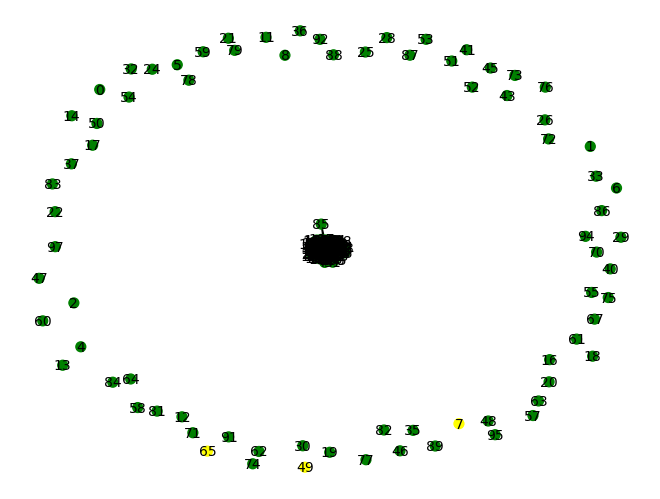

In [4]:
print("problem size", instance.size)
print("fire starts", instance.problem.fire_starts)
print("num teams", instance.problem.num_teams)
draw_graph(instance.problem.graph, instance.problem.fire_starts, node_size=50)

In [5]:
displayer = Displayer()
gene_displayer = GeneEvolutionRenderer()

## The Run

In [6]:
data = optimize_and_collect(instance)

[2025-02-05 23:31:25][  0]     0.04497409     0.04484630 {37400.00000000 37429.20000000 37800.00000000  72.85163004}
[2025-02-05 23:31:25][  1]     0.10738063     0.06095815 {37400.00000000 37436.80000000 37800.00000000  84.41421681}
[2025-02-05 23:31:25][  2]     0.17225075     0.06277514 {37400.00000000 37428.80000000 37800.00000000  72.46074800}
[2025-02-05 23:31:26][  3]     0.22278380     0.04888344 {37400.00000000 37430.00000000 37800.00000000  75.76278770}
[2025-02-05 23:31:26][  4]     0.27688313     0.05298376 {37400.00000000 37430.00000000 37800.00000000  75.76278770}
[2025-02-05 23:31:26][  5]     0.33867478     0.06044221 {37400.00000000 37426.40000000 37600.00000000  67.69815359}
[2025-02-05 23:31:26][  6]     0.40988493     0.06857347 {37400.00000000 37427.60000000 37800.00000000  72.37568653}
[2025-02-05 23:31:26][  7]     0.47077799     0.05936098 {37400.00000000 37428.00000000 37800.00000000  72.77362159}
[2025-02-05 23:31:26][  8]     0.52033257     0.04823184 {37400.

In [7]:
evaluator = Evaluators.MainEvaluator()
solutions = correct_solutions(instance, evaluator=evaluator)

## Results

In [8]:
best_solution, best_solutions_value = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value}]:\n{best_solution}")

Best solution [190]:
[7, 49, 65, 91, 96, 102, 118, 154, 161, 179]


In [9]:
# Save original function
_original_draw = nx.draw

# Define a wrapper function
def custom_draw(*args, node_size=50, **kwargs):  # Override node_size globally
  return _original_draw(*args, node_size=10, **kwargs)

# Replace nx.draw with the custom version
nx.draw = custom_draw

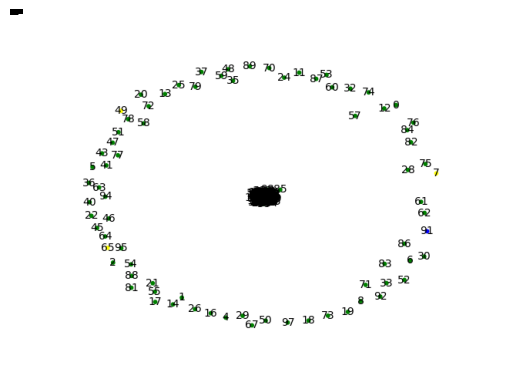

In [10]:
a = instance.problem.visualize_fire(displayer, best_solution)
a

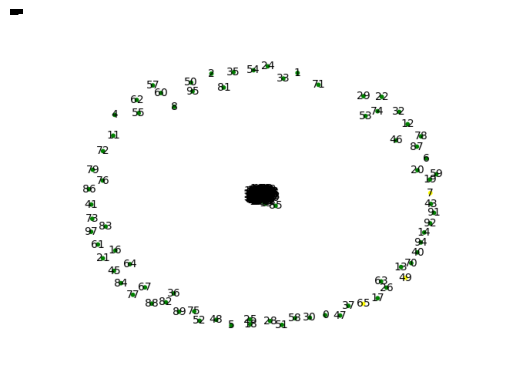

In [11]:
instance.problem.visualize_fires(displayer, solutions)

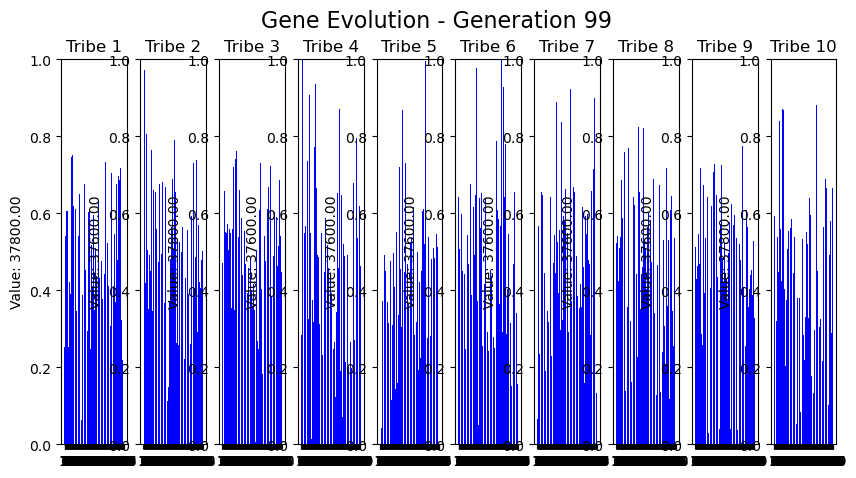

In [12]:
gene_displayer.visualize(data)

In [13]:
def collect_and_visualize(local_step_size):
    instance = Instance("problems/p1.json",
        evaluator=Evaluators.CummulativeEvaluator(),
        mutator=Mutators.WalkMutator(),
        generator=Generators.TruncatedNormal(),
        fixer=Fixers.ChoiceFixer(),
        weight_generator=WeightGenerators.SoftmaxWeights(),
        gene_mutator=GeneMutators.Normal(sigma=0.04))
    
    data = optimize_and_collect(instance,
                                tribe_number=4,
                                tribe_population=50,
                                number_of_iterations=200,
                                print_updates=False,
                                record_metrics=False,
                                local_step_size=local_step_size,
                                )
    print("data collected")
    visualize_gene_evolution(data)
    return gene_displayer.visualize(data)
    

data collected


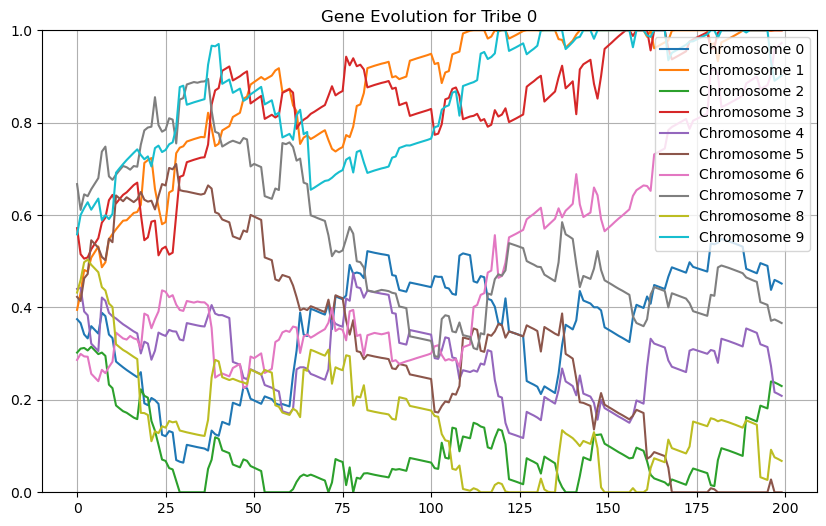

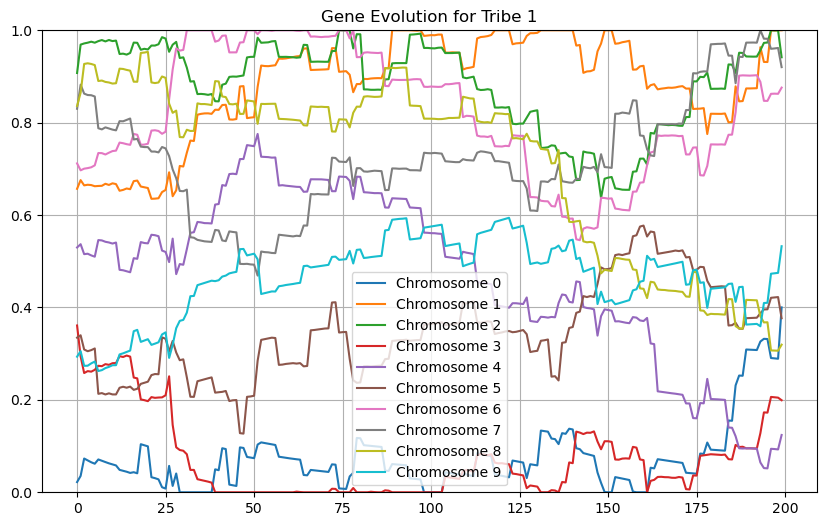

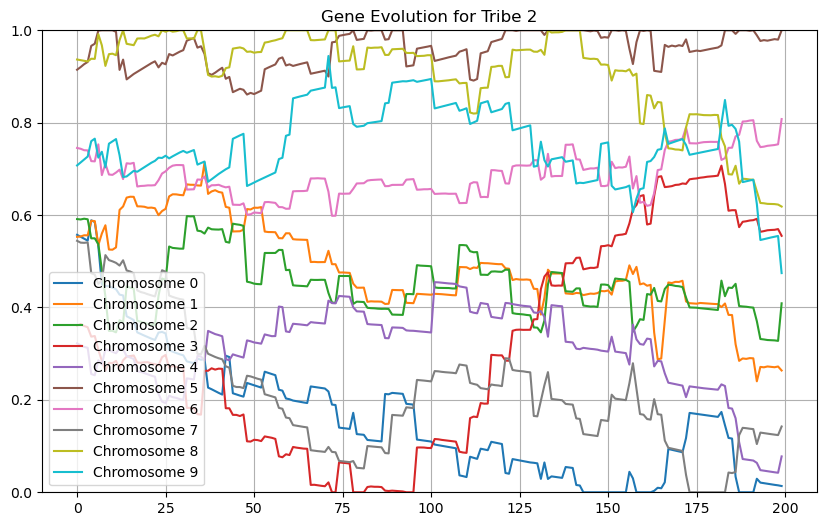

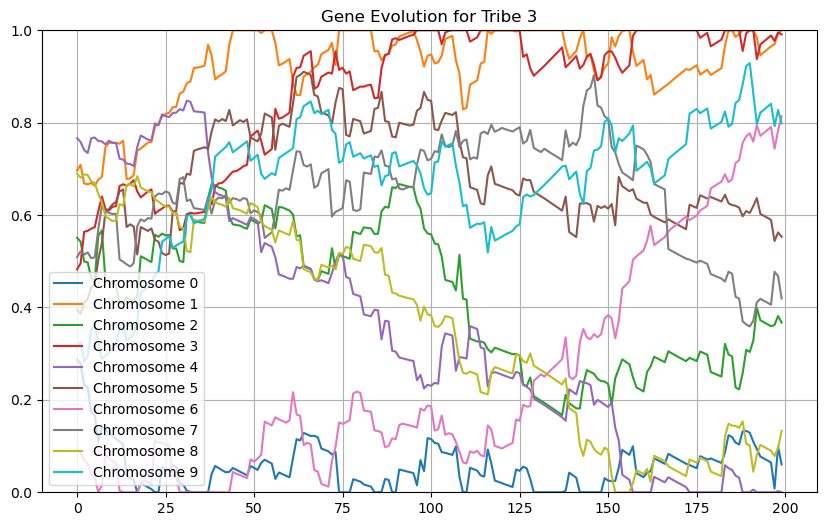

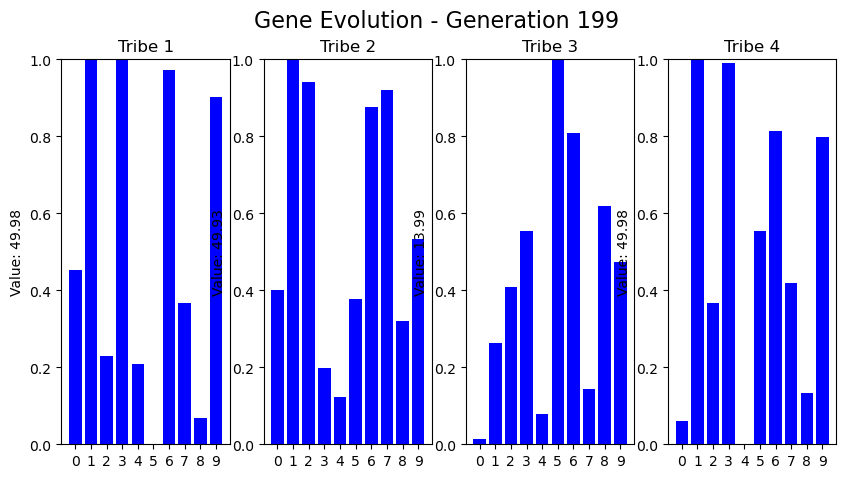

In [14]:
collect_and_visualize(0.03)

In [15]:
instance

In [16]:
evaluator = Evaluators.MainEvaluator()
solutions = [ (np.where(bool_array)[0].tolist(), evaluator(instance.problem, bool_array)) for bool_array, _ in instance.solutions ]

## Results

In [17]:
best_solution, best_solutions_value = max(solutions, key=lambda x: x[1])
print(f"Best solution [{best_solutions_value}]:\n{best_solution}")

Best solution [190]:
[7, 49, 65, 91, 96, 102, 118, 154, 161, 179]
